## Кластеризация и понижение размерности

In [38]:
import io
import os
import base64

import numpy as np
import pandas as pd
from tqdm.cli import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly
import plotly.express as px
from dash import Dash, dcc, html, Input, Output, no_update, callback

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import torch
from transformers import ViTImageProcessor, ViTModel

import pio

sns.set_theme(style="darkgrid", palette="Set2")

<font size="4"><b>Внимание! Файл с решением может быть тяжелым. Если он весит 20 Мб и более, заранее разделите его на несколько частей.</b></font>

---
### Задача 1. 

Докажите, что метод KMeans делит все пространство объектов на выпуклые многоугольники, возможно, неограниченные.

Пусть KMeans работает на $R^2$, и у нас всего два кластера. Точки, равноудаленные от них - это серединный перпендикуляр к отрезку, соединяющего центры. Все точки по одну сторону будут из симметрии ближе к центру в той же части. Значит эта линия будет границей для двух кластеров.

Общий случай. Пусть $\mu_1$ - центр первого кластера. Тогда аналогично проводим серединные перпендикуляры к отрезкам $[\mu_1, \mu_i], i > 1$,  Все точки, которые ближе к центру $\mu_1$ (первому кластеру) чем к центру $\mu_i$, будут лежать строго по одну сторону этого перпендикуляра. Кластером первого центра будет ровно пересечение всех таких полупространств, потому что они будут строго ближе к первому центру, чем к любому другому. Так как пересекаются выпуклые фигуры (полуплоскости), то пересечение тоже выпукло. Это многоугольник (возможно неограниченный), так как его границы - прямые.

Рассуждение для $R^n$ аналогично, однако делить будут гиперплоскости размерности $R^{n-1}$, которые будут сторонами выпуклого многоугольника.

---
### Задача 2. 

Как мы знаем из <a href="https://miptstats.github.io/courses/ad_fivt/lecture8.pdf">лекции</a>, в пространствах большой размерности расстояния между случайными объектами становятся неинформативными. Эта проблема известна как *проклятие размерности*, и она влечет соответствующие ограничения на использование методов, основанных на использовании расстоянии между объектами.

В этой задаче предлагается промоделировать ситуацию понижения размерности. Сгенерируйте достаточно большое количество точек в единичном кубе в пространстве некоторой размерности. Пример кода дан ниже

In [3]:
sample_size = 1000
dimention = 100
sample = np.random.uniform(size=(sample_size, dimention))

Повторите генерацию для нескольких размерностей пространства от 2 до 1000. Используйте не менее 7 различных значений размерностей пространства.

In [4]:
sample_list = []

dimensions = [3, 5, 10, 50, 100, 200, 500, 1000]

for dim in dimensions:
    sample_size = 1000
    sample = np.random.uniform(size=(sample_size, dim))
    sample_list.append(sample)

Для каждой размерности посчитайте норму каждой точки, тем самым получая набор значений расстояния от 0 до случайной точки. Нормируйте все расстояния, поделив на среднее полученных расстояний для каждой размерности пространства.

In [5]:
normalized_distances_list = []

for i, sample in enumerate(sample_list):
    norms = np.linalg.norm(sample, axis=1)
    mean_distance = np.mean(norms)
    normalized_distances_list.append(norms / mean_distance)
    print("Dimension = ", dimensions[i], " mean = ", mean_distance)

Dimension =  3  mean =  0.9551511981254784
Dimension =  5  mean =  1.2514021456625137
Dimension =  10  mean =  1.8046164869950574
Dimension =  50  mean =  4.071860918018545
Dimension =  100  mean =  5.7616570681031405
Dimension =  200  mean =  8.180883704116308
Dimension =  500  mean =  12.91531401816451
Dimension =  1000  mean =  18.26332099592314


Нарисуйте на одном графике <a href="https://miptstats.github.io/courses/python/09_seaborn.html#3.-Оценки-плотности" target="_blank">KDE-оценки плотности</a> нормированных расстояний для каждой размерности пространства.

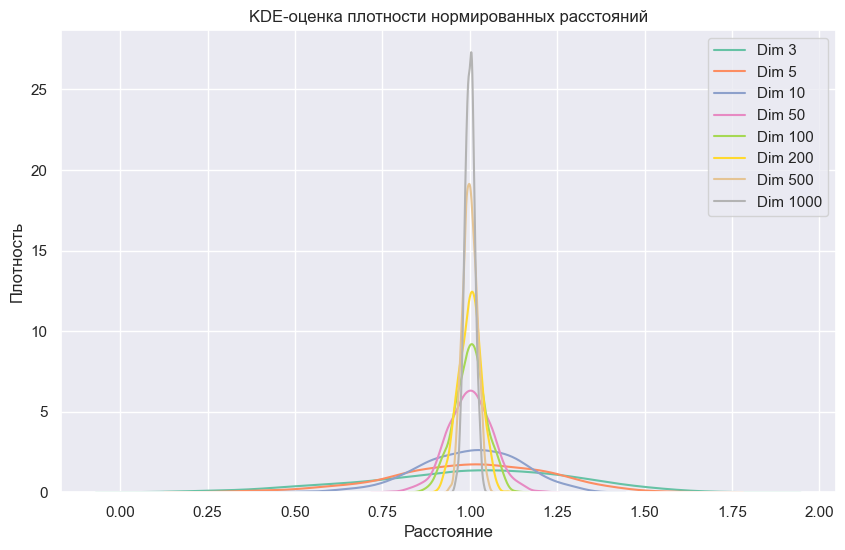

In [6]:
sns.set_style("darkgrid")

labels = [f"Dim {dim}" for dim in dimensions]

plt.figure(figsize=(10, 6))
for idx, normalized_distances in enumerate(normalized_distances_list):
    sns.kdeplot(normalized_distances, label=labels[idx])

plt.title('KDE-оценка плотности нормированных расстояний')
plt.xlabel('Расстояние')
plt.ylabel('Плотность')
plt.legend()  
plt.show()

Сделайте выводы

Проклятие размерности приводит к неинформативности расстояний между объектами в пространствах большой размерности. Огромная пика в распределении может быть проблемой, потому что это указывает на то, что существует небольшая область в пространстве, где объекты находятся очень близко друг к другу. Можно неправильно интерпретировать такие пики как структуру данных и принимать неправильные решения. Например, в случае кластеризации метод KMeans может попытаться разделить эти пики на отдельные кластеры, хотя на самом деле это может быть нежелательным разделением.

---
### Задача 3.

В этой задаче мы попробуем кластеризовать различными способами изображения котиков из датасета с <a href="https://miptstats.github.io/courses/ad_fivt/pca.html" target="_blank">семинара</a>.

Скачайте данные, загрузите их и отрисуйте несколько примеров.

Размерность cats: (15747, 12288)


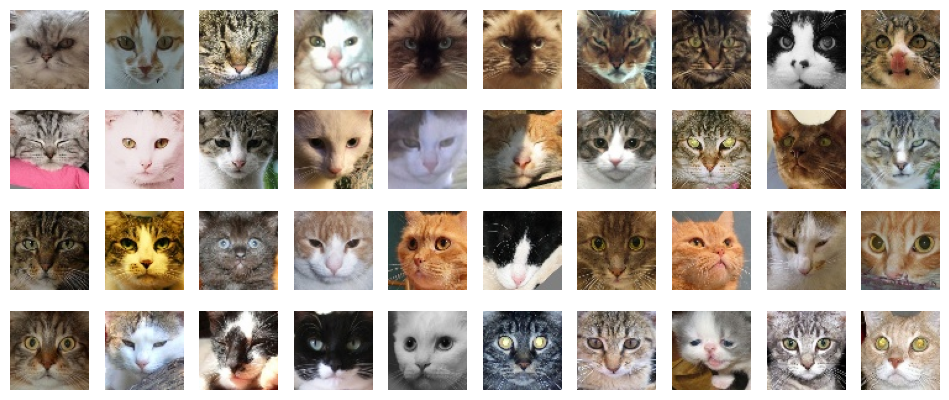

In [7]:
cats_path = "cats"
cats = []

for filename in os.listdir(cats_path):
    cats.append(plt.imread(os.path.join(cats_path, filename)))

cats = np.stack(cats).reshape(-1, 64 * 64 * 3)
print(f"Размерность cats: {cats.shape}")

# Визуализируем примеры
plt.figure(figsize=(12, 5))
for i in range(40):
    plt.subplot(4, 10, i + 1)
    plt.imshow(cats[i].reshape(64, 64, 3))
    plt.axis("off")

#### 1. Свойства метрики в пространстве котиков

Прежде всего давайте исследуем, наблюдается ли проблема проклятия размерности в пространстве котиков, фактически повторив исследование предыдущей задачи. Для этого выберите не менее 10000 случайных пар изображений и посчитайте расстояния между ними. Визуализируйте <a href="https://miptstats.github.io/courses/python/09_seaborn.html#3.-Оценки-плотности" target="_blank">KDE-оценку плотности</a> нормированных расстояний.

Повторите те же действия к результату применения PCA, рассмотрев разное количество компонент, например, для 30, 100 и 500. Обратите внимание, что PCA нужно обучать на всех изображениях, а не только для тех, для которых вы будете считать расстояния. Примеры обучения PCA можно посмотреть в <a href="https://miptstats.github.io/courses/ad_fivt/pca.html" target="_blank">ноутбуке</a> с занятия.

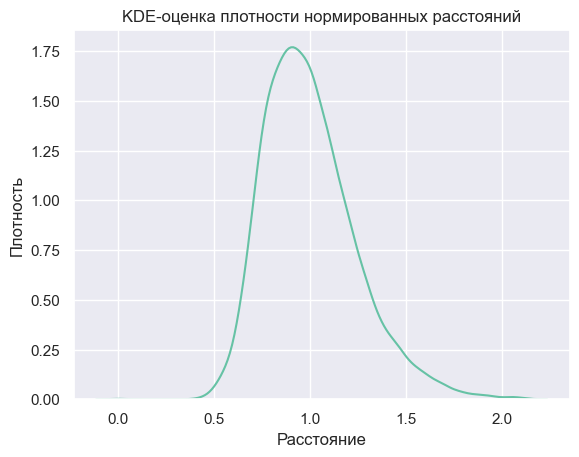

In [8]:
from sklearn.metrics.pairwise import pairwise_distances

sqrt_num_pairs = 100
indices = np.random.choice(len(cats), size=(sqrt_num_pairs, 2))

# Подсчет расстояний между выбранными парами изображений
distances = pairwise_distances(cats[indices[:, 0]], cats[indices[:, 1]])

# Нормировка расстояний
mean_distance = np.mean(distances)
normalized_distances = distances / mean_distance

# Визуализация KDE-оценки плотности нормированных расстояний
sns.kdeplot(normalized_distances.flatten())
plt.title('KDE-оценка плотности нормированных расстояний')
plt.xlabel('Расстояние')
plt.ylabel('Плотность')
plt.show()

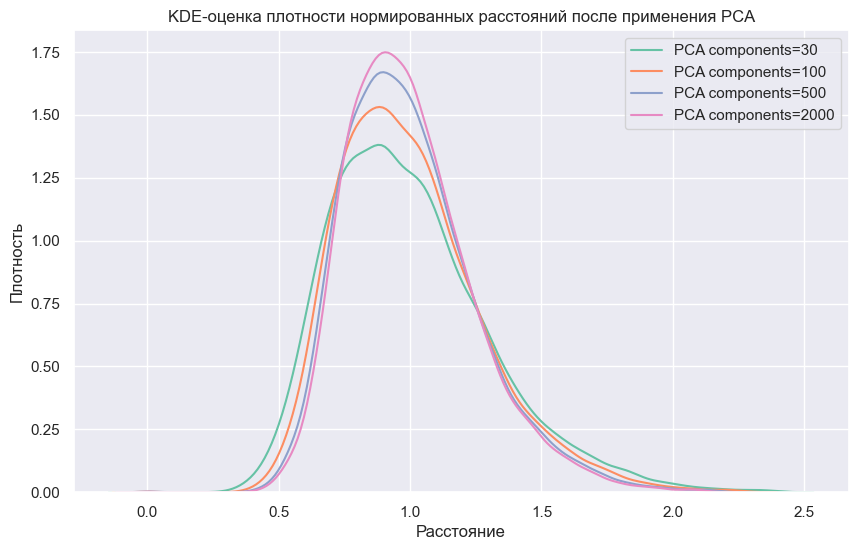

In [9]:
from sklearn.decomposition import PCA

# Функция для визуализации KDE-оценки плотности нормированных расстояний после применения PCA
def plot_kde_after_pca(components):
    pca = PCA(n_components=components)
    cats_pca = pca.fit_transform(cats)

    # Подсчет расстояний после применения PCA
    distances_pca = pairwise_distances(cats_pca[indices[:, 0]], cats_pca[indices[:, 1]])

    # Нормировка расстояний после применения PCA
    mean_distance_pca = np.mean(distances_pca)
    normalized_distances_pca = distances_pca / mean_distance_pca

    # Визуализация KDE-оценки плотности нормированных расстояний после применения PCA
    sns.kdeplot(normalized_distances_pca.flatten(), label=f"PCA components={components}")

# Повторим для разных количеств компонент
plt.figure(figsize=(10, 6))
plot_kde_after_pca(components=30)
plot_kde_after_pca(components=100)
plot_kde_after_pca(components=500)
plot_kde_after_pca(components=2000)
plt.title('KDE-оценка плотности нормированных расстояний после применения PCA')
plt.xlabel('Расстояние')
plt.ylabel('Плотность')
plt.legend()
plt.show()

Сделайте выводы

Соображения предыдущего пункта подтверждаются - чем больше размерность тем уже распределение и тем выше пик. Но в промежутке 30-2000 главных компонент распределение не вырождается в пику, поэтому на таких значениях можно пренебречь проклятием размерностей для нашего датасета.

#### 2. Кластеризация котиков по вектору изображения

Начнем эксперименты с самого простого способа: каждое изображение можно вытянуть в вектор размерности $64 \cdot 64 \cdot 3$, их и попытаемся кластеризовать. Обучите по этим объектам метод KMeans, пример можно посмотреть в <a href="https://miptstats.github.io/courses/ad_fivt/clustering.html" target="_blank">ноутбуке</a> по кластеризации

In [ ]:
%%time
# Преобразование каждого изображения в вектор
cats_vectors = cats.reshape(cats.shape[0], -1)

kmeans = KMeans(n_clusters=12, n_init=10, random_state=42)
kmeans.fit(cats_vectors)
labels = kmeans.predict(cats_vectors)

Теперь отобразим изображения на плоскость с помощью PCA и визуализируем полученные предсказания цветом, как это было сделано на семинаре для ответов на вопросы в бот. Ниже уже реализована функция отрисовки `visualize_images_clusterisation`, вам требуется лишь применить PCA и вызвать функцию с правильными параметрами.

In [82]:
def visualize_images_clusterisation(images, projection, clusters, port=None, use_dash=False):
    '''
    Визуализиует двумерную проекцию эмбеддингов изображений, 
    во всплывающем окне показывает сами изображения
 
    :param images: набор изображений
    :param projection: двумерная проекция изображений или эмбеддингов изображений
    :param clusters: предсказанные кластера
    :param port: опциональный параметр, порт на котором поднимается визуализация: 
                 одинаковые порты - одинаковые графики, но если в ноутбуке открыто много портов, то могут начаться лаги
    :param use_dash: если True, то рисуются картинки, но не сохраняется интерактивный график, 
                     если False, то наоборот график в ноутбуке сохранится, но картинок не будет
    '''
    plotly.offline.init_notebook_mode()
 
    # Рисуем график с точками как на семинаре
    fig = px.scatter(
        x=projection[:, 0], y=projection[:, 1], 
        hover_name=clusters, 
        hover_data={'image_idx': list(range(len(images)))},
        color=clusters.astype(str),
        width=1000, height=800,
        title='PCA проекция изображений на плоскость',
        size=[1] * len(images),
        size_max=12,
    )
 
    if not use_dash:
        fig.show()
        return
 
    # Добавляем во всплывающее окошко (hover box) изображения
    fig.update_traces(
        hoverinfo="none",
        hovertemplate=None,
    )
 
    app = Dash(__name__)
 
    app.layout = html.Div(
        className="container",
        children=[
            dcc.Graph(id="graph-2-dcc", figure=fig, clear_on_unhover=True),
            dcc.Tooltip(id="graph-tooltip-2", direction='bottom'),
        ],
    )
 
    @callback(
        Output("graph-tooltip-2", "show"),
        Output("graph-tooltip-2", "bbox"),
        Output("graph-tooltip-2", "children"),
        Output("graph-tooltip-2", "direction"),
 
        Input("graph-2-dcc", "hoverData"),
    )
    def display_hover(hoverData):
        '''
        Настраивает всплывающее окно hover box.
 
        :param hoverData: данные соответствующей точки
        '''
        if hoverData is None:
            return False, no_update, no_update, no_update
 
        # Достаем индекс картинки, который выше положили в hover_data
        hover_data = hoverData["points"][0]
        image_idx = hover_data['customdata'][0]
        # И получаем само изображение кота
        image = Image.fromarray(images[image_idx].reshape(64, 64, 3))
 
        # Преобразовываем изображение в base64 кодировку
        buffer = io.BytesIO()
        image.save(buffer, format="jpeg")
        encoded_image = base64.b64encode(buffer.getvalue()).decode()
        image_url = "data:image/jpeg;base64, " + encoded_image
 
        image_children = [
            html.Img(
                src=image_url,
                style={"width": "196px"},
            ),
        ]
 
        return True, hover_data["bbox"], image_children, 'top'
 
    if port is None:
        port = str(np.random.randint(5000, 15000))
    app.run(port=port, debug=True, jupyter_height=800)
 
    return app
 

In [ ]:
pca = PCA(n_components=2)
cats_pca = pca.fit_transform(cats)

visualize_images_clusterisation(cats, cats_pca, labels)
#filename='1_visualize.png

Для каждого кластера нарисуйте по 5-10 типичных изображений, то есть ближайших к центру кластера. Похожую операцию мы видели на занятии в <a href="https://miptstats.github.io/courses/ad_fivt/clustering.html" target="_blank">ноутбуке</a> по кластеризации.

*Примечание.* Для одного кластера рисуйте картинки "в строчку". Так будет удобно как вам самим, так и проверяющему. Примеры можно посмотреть в <a href="https://miptstats.github.io/courses/ad_fivt/pca.html" target="_blank">ноутбуке</a> по PCA.

C:\TEMP\ipykernel_4464\1632613453.py:35: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.



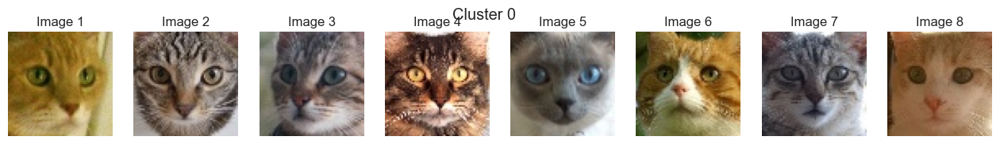

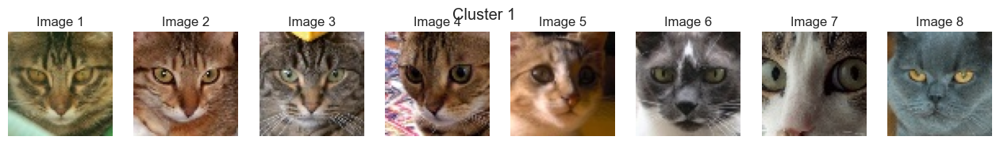

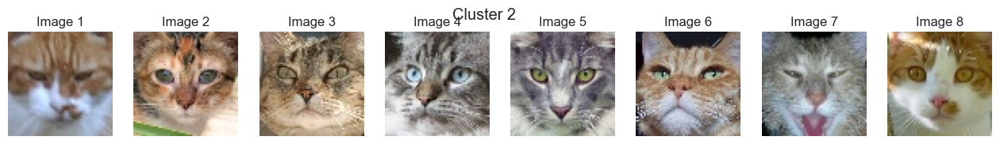

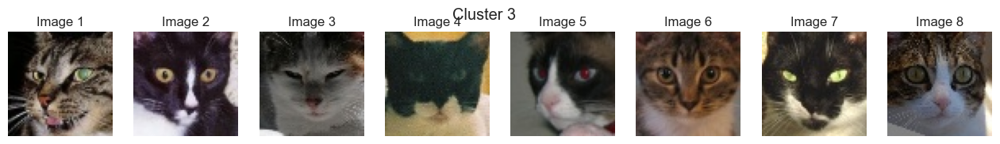

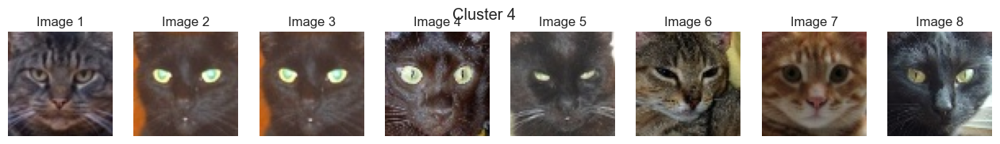

...

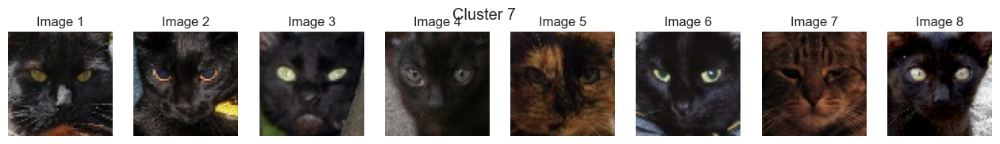

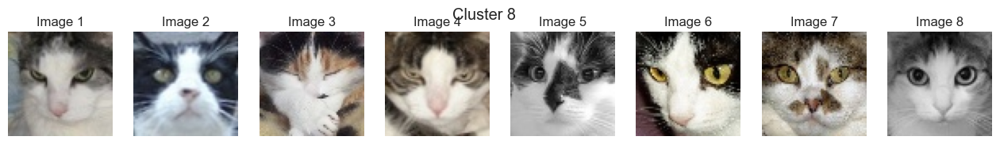

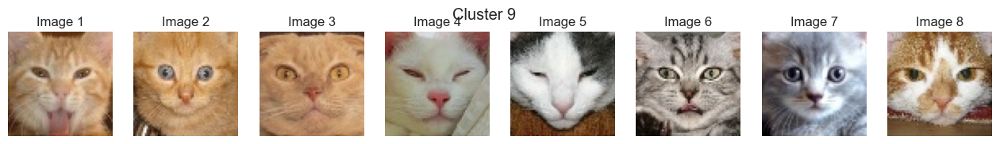

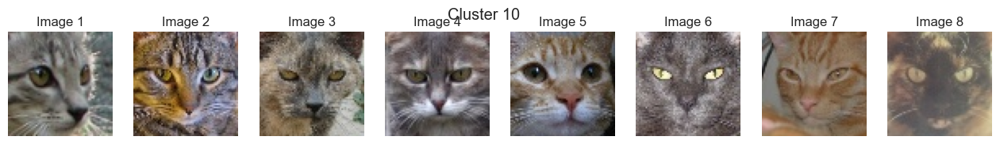

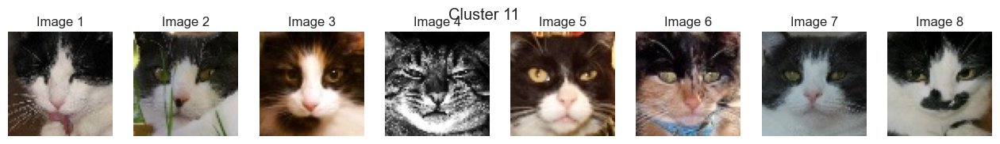

In [84]:
def visualize_cluster_images(images, projection, clusters, num_images_per_cluster=8):
    """
    Функция отрисовки типичных изображений каждого кластера

    :param images: набор изображений
    :param projection: двумерная проекция изображений или эмбеддингов изображений
    :param clusters: предсказанные кластера
    :param num_images_per_cluster: количество изображений для отображения из каждого кластера (по умолчанию 8)
    """
    unique_clusters = np.unique(clusters)
    
    for cluster_id in unique_clusters:
        cluster_indices = np.where(clusters == cluster_id)[0]
        cluster_images = images[cluster_indices]
        cluster_projection = projection[cluster_indices]
        
        # Находим центр кластера
        cluster_center = np.mean(cluster_projection, axis=0)
        # Считаем расстояния до центра от каждой точки кластера
        distances = np.linalg.norm(cluster_projection - cluster_center, axis=1)
        # Сортируем расстояния и берем индексы в порядке возрастания расстояний
        closest_indices = np.argsort(distances)
        
        # Создаем множество для хранения уникальных изображений в строке
        unique_images = set()
        num_added_images = 0
        
        # Визуализируем ближайшие уникальные изображения к центру кластера
        plt.figure(figsize=(16, 2 * (num_images_per_cluster + 1) // 8))
        for i in closest_indices:
            if num_added_images >= num_images_per_cluster:
                break
            
            # Преобразуем изображение в строку и добавляем в множество
            image_str = cluster_images[i].tostring()
            if image_str not in unique_images:
                unique_images.add(image_str)
                
                # Отображаем изображение
                plt.subplot(1, 8, num_added_images % 8 + 1)
                plt.imshow(cluster_images[i].reshape(64, 64, 3))
                plt.axis('off')
                plt.title(f"Image {num_added_images + 1}")
                num_added_images += 1
                
        plt.suptitle(f"Cluster {cluster_id}")
        plt.show()

# Предполагается, что cats - это массив изображений, cats_pca - это их двумерная проекция, а labels - предсказанные кластеры
visualize_cluster_images(cats, cats_pca, labels)


**Наблюдаются ли какие-то закономерности в изображениях внутри одного кластера? Если да, то опишите отличительные черты кластеров.**

Да. Картинки внутри одного кластера в целом похожи друг на друга по окраске мородочек котов. В том числе есть кластеры, соответствующим белым, белым с черным, серым, серым с полосочками, черным, рыжим с полосочками. Как видно, некоторые кластеры перемешаны внутри себя и пересекаются с другими. 

**Подумайте, чем может быть плох такой подход? Какая проблема могла возникнуть и возникла ли? Обратите внимание на проведенное ранее исследование.**

Возникла проблема с тем, что кластеры пересекаюся, и содеражат картинки не всегда похожие на остальные из того же кластера. Это похоже на проблему всего метода целиком - даже разные картинки могут оказаться близкими в смысле расстояния. Кроме того, возможно слишком много кластеров, и алгоритм не может настолько подробно классифицировать котов, то есть само количество тех признаков, по которым может делить метод, не так высоко. Это существенное ограничение.

То, что результат сильно не улучшился, косвенно подтвержает то, что на двумерной плоскости проекция примерно такая же.

#### 3. PCA + кластеризация

Попробуем уменьшить размерность перед кластеризацией с помощью PCA, спроектировав изображения на первые несколько главных компонент 

**Примечание.** Не стоит брать больше 100 главных компонент

Сделайте кластеризацию:

In [85]:
%%time
pca = PCA(n_components=40)
cats_pca = pca.fit_transform(cats)

kmeans = KMeans(n_clusters=12, n_init=10, random_state=42)
kmeans.fit(cats_vectors)
labels = kmeans.predict(cats_vectors)

CPU times: total: 16min 41s
Wall time: 3min 38s


Визуализируйте полученные кластера:

In [ ]:
pca_projection = PCA(n_components=2)
cats_pca_projection = pca_projection.fit_transform(cats_pca)
visualize_images_clusterisation(cats, cats_pca_projection, labels)
#filename='2_visualize.png

Нарисуйте по 5-10 типичных изображений для новых кластеров

C:\TEMP\ipykernel_4464\1632613453.py:35: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.



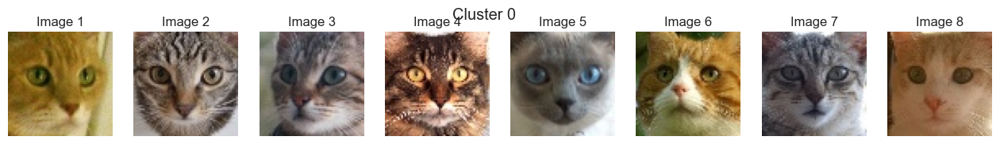

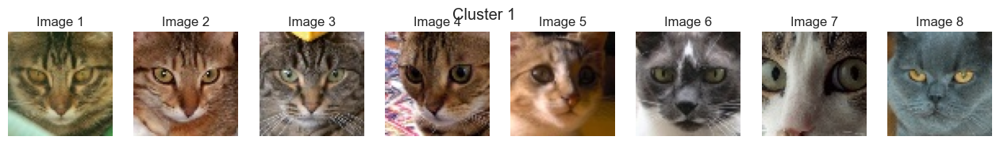

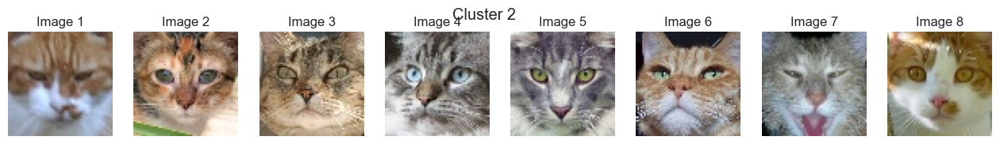

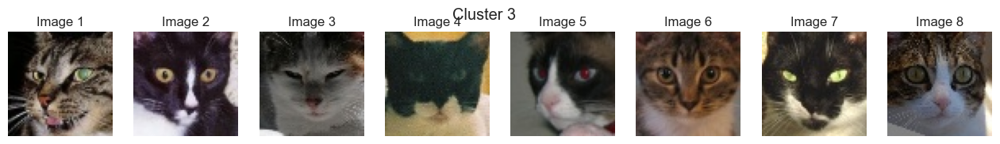

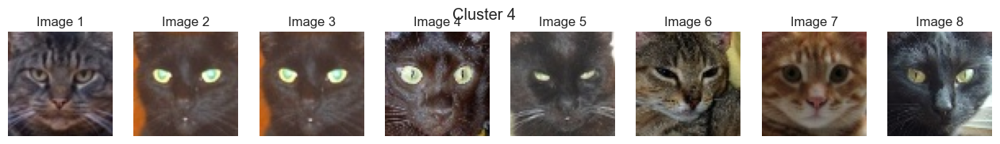

...

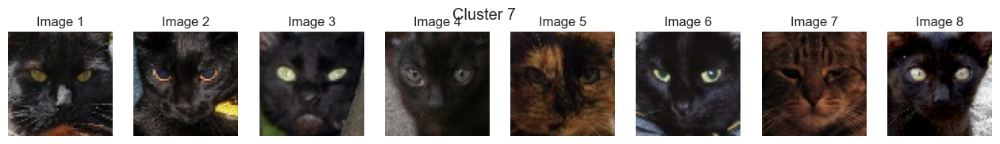

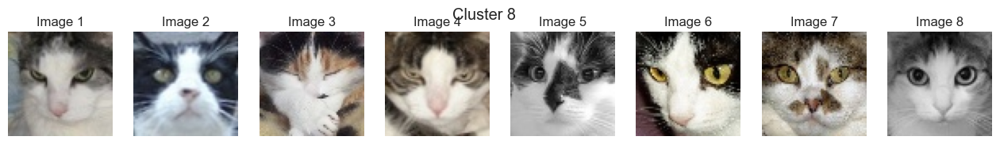

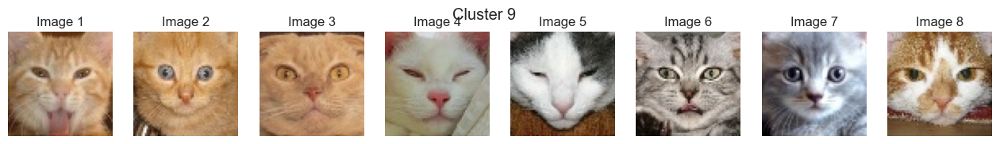

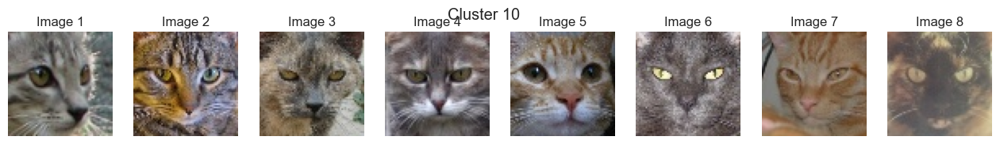

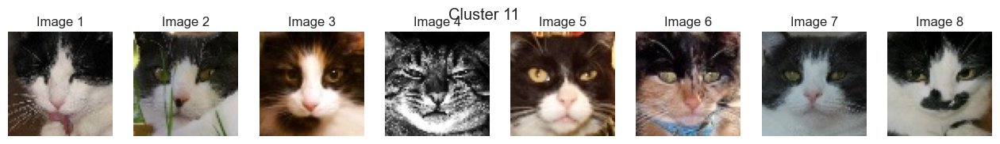

In [87]:
visualize_cluster_images(cats, cats_pca_projection, labels)

**Опишите отличительные черты кластеров:**

В целом точно так же, как в предыдущем пункте. Есть рыжие, рыжие с полосками, серые, серые с полосками, белые с пятнышами, черные котики.

**Сильно ли они отличаются от предыдущего способа?**

Не сильно, примерно то же самое. Похоже, что классифицируются полосатые мордочки чуть чуть лучше, либо ошибка выборки изображей. Так же есть перемешивание в рамках одного кластера соседних, и соседние накладываются друг на друга. Это в том числе связано с тем, высота пика плотности нормированных расстояний не сильно уменьшилась (такое у нас свойство метрики), поэтому уменьшение размерностей не даст существенного вклада.

Это еще подтверждает тот факт, что на двумерной проекции кластеризация выглядит почти идентичной.

#### 4. Нейросетевые эмбеддинги + кластеризация

Попробуем применить к изображениям такой же подход, как с текстами. То есть возьмем хорошую уже обученную нейросеть, получим с ее помощью эмбеддинги изображений и будем дулеть кластеризацию этих эмбеддингов.

Выберите на <a target="_blank" href="https://huggingface.co/models">huggingface</a> модель для получения эмбеддингов изображений.

**Примечания**
- Нам нужны `CV` модели для задачи извлечения признаков (в фильтрах huggingface называются `Image Feature Extraction`).
- Не выбирайте слишком тяжелые модели (с суффиксами `-huge`, `-giant`, `-large` и прочим), нам это ни к чему, так как картинки маленькие и простые. К тому же это замедлит предсказание эмбеддингов.
- Обычно в карточке модели есть пример применения, который можно скопировать и как в семинаре в цикле применить ко всем батчам изображениям.
- Некоторые модели могут возвращать не эмбеддинг размерности `(D,)`, а матрицу признаков размерности `(n, D)`, в этому случае надо применить average-pooling, усреднив по предпоследней оси.

Загрузите модель, примените к одному тестовому изображению кота и посмотрите на размерность полученного тензора

In [17]:
#example_image = cats[0].reshape(64, 64, 3)
# Загрузка и тестовое применение модели
from urllib.request import urlopen
from PIL import Image
import timm

model = timm.create_model(
    'vit_small_patch16_224.augreg_in1k',
    pretrained=True,
    num_classes=0 
)

model = model.eval()
data_config = timm.data.resolve_model_data_config(model)
transforms = timm.data.create_transform(**data_config, is_training=False)

img = Image.open('cats/1.jpg')

output = model(transforms(img).unsqueeze(0)).squeeze()

print(output.shape)

torch.Size([384])


Теперь примените загруженную модель ко всем картинкам

In [18]:
cats_emb = []

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

for i, filename in enumerate(os.listdir(cats_path)):
    cur_img = Image.open(os.path.join(cats_path, filename))
    cur_img_tensor = transforms(cur_img).unsqueeze(0).to(device)
    emb = model(cur_img_tensor).squeeze().cpu().detach().numpy()
    cats_emb.append(emb)
    
    if i % 5000 == 0:
        print(f"Processed {i} images")


cats_emb = np.array(cats_emb)

C:\fedya\Lib\site-packages\timm\models\vision_transformer.py:91: UserWarning:

1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)



Processed 0 images
Processed 5000 images
Processed 10000 images
Processed 15000 images


Сделайте кластеризацию полученных эмбеддингов

In [88]:
kmeans = KMeans(n_clusters=12, n_init=30, random_state=42)

kmeans.fit(cats_emb)

labels = kmeans.predict(cats_emb)

Визуализируйте полученные кластера:

In [ ]:
pca = PCA(n_components=2)
cats_emb_pca = pca.fit_transform(cats_emb)

visualize_images_clusterisation(cats_emb_pca, cats_emb, labels)
#filename='3_visualize.png

Нарисуйте по 5-10 типичных изображений для новых кластеров

C:\TEMP\ipykernel_4464\1632613453.py:35: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.



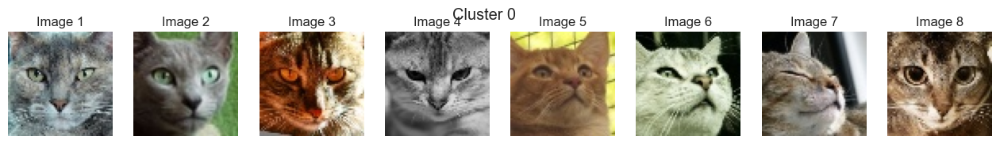

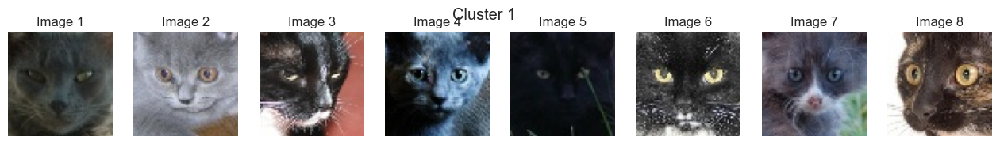

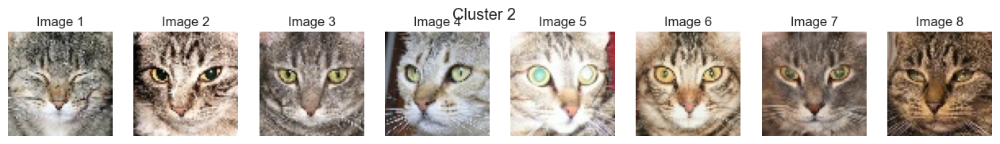

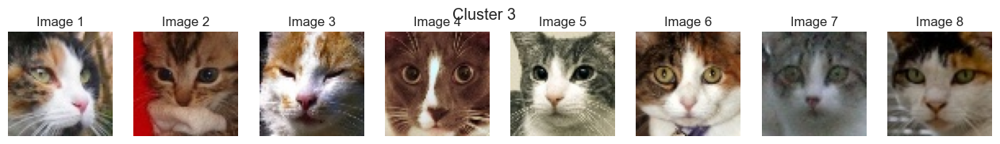

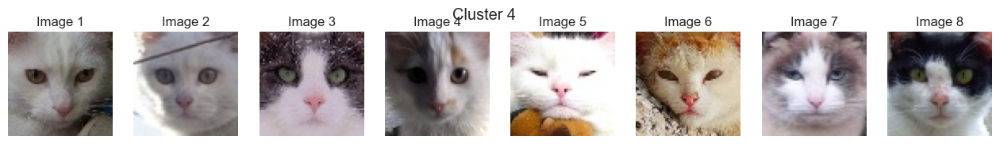

...

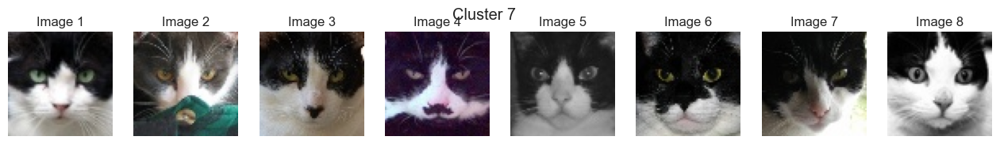

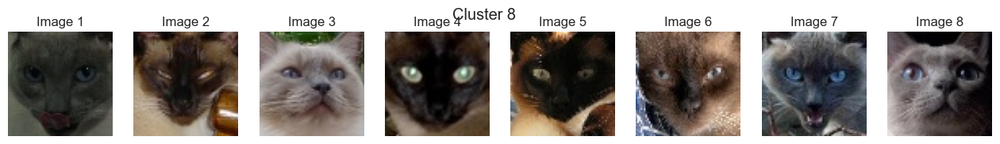

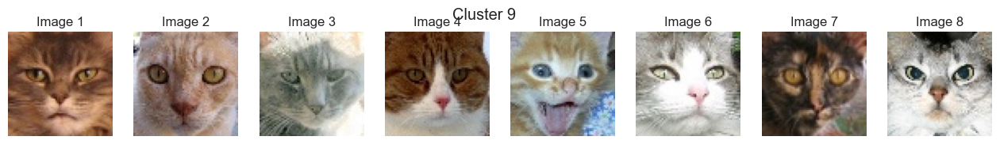

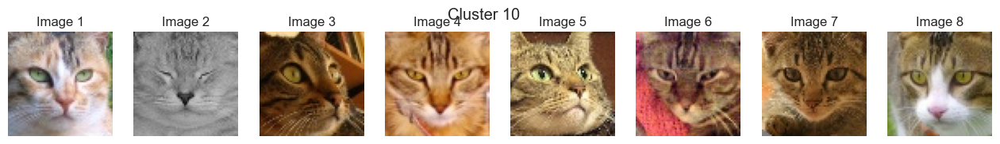

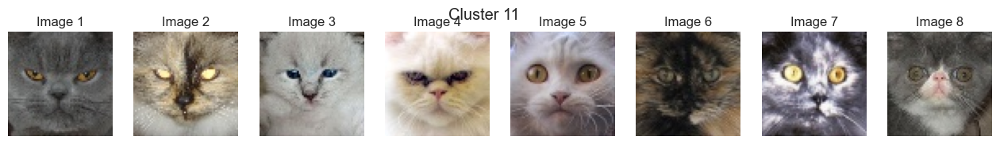

In [92]:
visualize_cluster_images(cats, cats_emb_pca, labels)

Опишите отличительные черты кластеров:

Внутри кластера намного чётче прослеживается структура мородочек котов. Это цвет + наличие пятнышек + наличие полосочек. Например белые коты, черные, белые с черными пятнышками, серые с полосочками, рыжие с полосочками.

Чем отличаются кластеры, полученные этим способом от первых двух?

Соседние кластеры накладываются друг на друга меньше, чем раньше; внутри одного кластера четче структура. То есть алгоритм выходит эффективнее. Ещё в проекциях у нас более хаотичное расположение, разные кластеры накладываются друг на друга, а не отдельные пятна.

#### 5. Выводы
Сделайте выводы: 

Третий метод оказался наиболее эффективным. Можно объяснить так: после эмбендинга нейросетью мы получили некоторые скрытые слои, состояния, и уже начали кластеризировать сразу по ним; картинки с разными слоями находятся далеко друг от друга в смысле расстояний. Тем самым мы разделили датасет на различные части, и разные группы котов отделили друг от друга. Ровно по этой причине после проекции на двумерную плоскость мы получили наложение кластеров друг на друга, это соответствует пересечению признаков картинок.

Первый и второй метод так не могут, потому что начинают кластеризировать по расстоянию сразу. Можно считать, что все картинки расположены рядом в смысле расстояния, поэтому каждый кластер задевает соседние картинки и есть перемешивание между кластерами. Второй метод не сильно улучшил первый, потому что уменьшение размерности делает пространство картинок не достаточно разреженным для точной классификации. Пересечение кластеров на двумерной проекции не настолько четкое по признакам, что подтверждает предположение.